# Project - 3

CONTEXT: A telecom company wants to use their historical customer data to predict behaviour to retain customers. You can analyse all relevant customer data and develop focused customer retention programs.
- DATA DESCRIPTION: Each row represents a customer, each column contains customer’s attributes described on the column Metadata. The data set includes information about:
- Customers who left within the last month – the column is called Churn
- Services that each customer has signed up for – phone, multiple lines, internet, online security, online backup, device protection, tech support, and streaming TV and movies
- Customer account information – how long they’ve been a customer, contract, payment method, paperless billing, monthly charges, and total charges
- Demographic info about customers – gender, age range, and if they have partners and dependents
<br>

PROJECT OBJECTIVE: Build a model that will help to identify the potential customers who have a higher probability to churn. This help the company to understand the pinpoints and patterns of customer churn and will increase the focus on strategising customer retention.


In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import norm, skew
from scipy import stats
import statsmodels.api as sm

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.metrics import classification_report
from sklearn import model_selection
import warnings
import plotly.graph_objects as go
from imblearn.over_sampling import SMOTE

### 1. Import and warehouse data:
- Import all the given datasets. Explore shape and size.
- Merge all datasets onto one and explore final shape and size.

In [2]:
data1 = pd.read_csv('TelcomCustomer-Churn_1.csv')
data1.head(5)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No


In [3]:
data2 = pd.read_csv('TelcomCustomer-Churn_2.csv')
data2.head(5)

,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [4]:
print('Shape of TelcomCustomer-Churn_1.csv: ', data1.shape)
print('Shape of TelcomCustomer-Churn_2.csv: ', data2.shape)

Shape of TelcomCustomer-Churn_1.csv:  (7043, 10)
Shape of TelcomCustomer-Churn_2.csv:  (7043, 11)


In [5]:
print('Information of TelcomCustomer-Churn_1.csv: \n', data1.info())
print('Information of TelcomCustomer-Churn_2.csv: \n', data2.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   customerID       7043 non-null   object
 1   gender           7043 non-null   object
 2   SeniorCitizen    7043 non-null   int64 
 3   Partner          7043 non-null   object
 4   Dependents       7043 non-null   object
 5   tenure           7043 non-null   int64 
 6   PhoneService     7043 non-null   object
 7   MultipleLines    7043 non-null   object
 8   InternetService  7043 non-null   object
 9   OnlineSecurity   7043 non-null   object
dtypes: int64(2), object(8)
memory usage: 550.4+ KB
Information of TelcomCustomer-Churn_1.csv: 
 None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   OnlineBackup      7043 non-null   object 
 1 

Observation
- From the above analysis, its clear that the 2 data sets have same number of entries present as 7043.
- Dataset1 has 10 columns while Dataset2 has 11 columns.
- the 2 datasets should be merged side-by-side to create the dataset as 7043x21.

In [6]:
dataset = pd.merge(data1,data2,left_index=True,right_index=True)

In [7]:
dataset.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [8]:
dataset.shape

(7043, 21)

In [9]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


### 2. Data cleansing
- Missing value treatment
- Convert categorical attributes to continuous using relevant functional knowledge
- Drop attribute/s if required using relevant functional knowledge
- Automate all the above steps

In [10]:
dataset.nunique()

customerID          7043
gender                 2
SeniorCitizen          2
Partner                2
Dependents             2
tenure                73
PhoneService           2
MultipleLines          3
InternetService        3
OnlineSecurity         3
OnlineBackup           3
DeviceProtection       3
TechSupport            3
StreamingTV            3
StreamingMovies        3
Contract               3
PaperlessBilling       2
PaymentMethod          4
MonthlyCharges      1585
TotalCharges        6531
Churn                  2
dtype: int64

In [11]:
dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
SeniorCitizen,7043.0,0.162147,0.368612,0.00,0.0,0.00,0.00,1.00
tenure,7043.0,32.371149,24.559481,0.00,9.0,29.00,55.00,72.00
MonthlyCharges,7043.0,64.761692,30.090047,18.25,35.5,70.35,89.85,118.75


In [12]:
columns = dataset.loc[:, dataset.dtypes == 'object'].columns.tolist()
for cols in columns:
    print(f'Unique values for {cols} is \n{dataset[cols].unique()}\n')

Unique values for customerID is 
['7590-VHVEG' '5575-GNVDE' '3668-QPYBK' ... '4801-JZAZL' '8361-LTMKD'
 '3186-AJIEK']

Unique values for gender is 
['Female' 'Male']

Unique values for Partner is 
['Yes' 'No']

Unique values for Dependents is 
['No' 'Yes']

Unique values for PhoneService is 
['No' 'Yes']

Unique values for MultipleLines is 
['No phone service' 'No' 'Yes']

Unique values for InternetService is 
['DSL' 'Fiber optic' 'No']

Unique values for OnlineSecurity is 
['No' 'Yes' 'No internet service']

Unique values for OnlineBackup is 
['Yes' 'No' 'No internet service']

Unique values for DeviceProtection is 
['No' 'Yes' 'No internet service']

Unique values for TechSupport is 
['No' 'Yes' 'No internet service']

Unique values for StreamingTV is 
['No' 'Yes' 'No internet service']

Unique values for StreamingMovies is 
['No' 'Yes' 'No internet service']

Unique values for Contract is 
['Month-to-month' 'One year' 'Two year']

Unique values for PaperlessBilling is 
['Yes' 'No']


In [13]:
dataset.TotalCharges.isnull().sum()

0

In [14]:
dataset[dataset.TotalCharges ==' ']

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
488,4472-LVYGI,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,,No
753,3115-CZMZD,Male,0,No,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,,No
936,5709-LVOEQ,Female,0,Yes,Yes,0,Yes,No,DSL,Yes,...,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,,No
1082,4367-NUYAO,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,,No
1340,1371-DWPAZ,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,,No
3331,7644-OMVMY,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,,No
3826,3213-VVOLG,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,,No
4380,2520-SGTTA,Female,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,,No
5218,2923-ARZLG,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,,No
6670,4075-WKNIU,Female,0,Yes,Yes,0,Yes,Yes,DSL,No,...,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,,No


In [15]:
# we'll be dropping these 11 rows from the data set as they have empty total-charges present.
# Also, we can see that the Tenure details for these 11 columns is maintained as 0 (not correct).
x = dataset[dataset.TotalCharges ==' '].index
dataset.drop(index=x,inplace=True)
dataset.shape

(7032, 21)

In [16]:
# we'll also drop CustomerID which is of no use for us.
dataset.drop(columns='customerID',inplace=True)

In [17]:
dataset.shape

(7032, 20)

In [18]:
# now, we'll be converting all the object to categorical variables.
dataset.columns

Index(['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure',
       'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity',
       'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod',
       'MonthlyCharges', 'TotalCharges', 'Churn'],
      dtype='object')

In [19]:
dataset.TotalCharges=dataset.TotalCharges.astype(float)

In [20]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7032 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            7032 non-null   object 
 1   SeniorCitizen     7032 non-null   int64  
 2   Partner           7032 non-null   object 
 3   Dependents        7032 non-null   object 
 4   tenure            7032 non-null   int64  
 5   PhoneService      7032 non-null   object 
 6   MultipleLines     7032 non-null   object 
 7   InternetService   7032 non-null   object 
 8   OnlineSecurity    7032 non-null   object 
 9   OnlineBackup      7032 non-null   object 
 10  DeviceProtection  7032 non-null   object 
 11  TechSupport       7032 non-null   object 
 12  StreamingTV       7032 non-null   object 
 13  StreamingMovies   7032 non-null   object 
 14  Contract          7032 non-null   object 
 15  PaperlessBilling  7032 non-null   object 
 16  PaymentMethod     7032 non-null   object 


In [21]:
dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
SeniorCitizen,7032.0,0.162400,0.368844,0.00,0.0000,0.000,0.0000,1.00
tenure,7032.0,32.421786,24.545260,1.00,9.0000,29.000,55.0000,72.00
MonthlyCharges,7032.0,64.798208,30.085974,18.25,35.5875,70.350,89.8625,118.75
TotalCharges,7032.0,2283.300441,2266.771362,18.80,401.4500,1397.475,3794.7375,8684.80


Observations:
- The data type of SeniorCitizen and TotalCharges is corrected.
- The empty entries present for the tenure-Totalcharges is also deleted.
- The datatypes from object to Category were changed.<br>
<br>
- Now, we'll use Label encoder to make change the categorical data types(with value as yes, no) to continous values.
- We will also replace the string 'No internet service' to 'No', for better readings in model.
- We'll then use one-hot encoding on the 3 categorical cols with more than 2 unique values to have all data in numerical form.

In [22]:
dataset.replace('No internet service','No',inplace=True)

In [23]:
columns = dataset.loc[:, dataset.dtypes == 'object'].columns.tolist()
for cols in columns:
    print(f'Unique values for {cols} is \n{dataset[cols].unique()}\n')

Unique values for gender is 
['Female' 'Male']

Unique values for Partner is 
['Yes' 'No']

Unique values for Dependents is 
['No' 'Yes']

Unique values for PhoneService is 
['No' 'Yes']

Unique values for MultipleLines is 
['No phone service' 'No' 'Yes']

Unique values for InternetService is 
['DSL' 'Fiber optic' 'No']

Unique values for OnlineSecurity is 
['No' 'Yes']

Unique values for OnlineBackup is 
['Yes' 'No']

Unique values for DeviceProtection is 
['No' 'Yes']

Unique values for TechSupport is 
['No' 'Yes']

Unique values for StreamingTV is 
['No' 'Yes']

Unique values for StreamingMovies is 
['No' 'Yes']

Unique values for Contract is 
['Month-to-month' 'One year' 'Two year']

Unique values for PaperlessBilling is 
['Yes' 'No']

Unique values for PaymentMethod is 
['Electronic check' 'Mailed check' 'Bank transfer (automatic)'
 'Credit card (automatic)']

Unique values for Churn is 
['No' 'Yes']



In [24]:
#Create a label encoder object
le = LabelEncoder()

# Label Encoding will be used for columns with 2 or less unique 

le_count = 0
for col in dataset.columns[1:]:
    if dataset[col].dtype == 'object':
        if len(list(dataset[col].unique())) <= 2:
            le.fit(dataset[col])
            dataset[col] = le.transform(dataset[col])
            le_count += 1
print('{} columns were label encoded.'.format(le_count))

11 columns were label encoded.


In [25]:
dataset.head(5)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,1,0,1,0,No phone service,DSL,0,1,0,0,0,0,Month-to-month,1,Electronic check,29.85,29.85,0
1,Male,0,0,0,34,1,No,DSL,1,0,1,0,0,0,One year,0,Mailed check,56.95,1889.50,0
2,Male,0,0,0,2,1,No,DSL,1,1,0,0,0,0,Month-to-month,1,Mailed check,53.85,108.15,1
3,Male,0,0,0,45,0,No phone service,DSL,1,0,1,1,0,0,One year,0,Bank transfer (automatic),42.30,1840.75,0
4,Female,0,0,0,2,1,No,Fiber optic,0,0,0,0,0,0,Month-to-month,1,Electronic check,70.70,151.65,1


In [26]:
# The text for Multiple line is - No phone service.
# we need to make change again for this column.

# This practice is done on purpose to show how manually encoding can be done.

dataset.MultipleLines.replace('No phone service','No',inplace=True)
encode = {"MultipleLines": {"No": 0, "Yes": 1}, "gender": {'Female':0, 'Male':1}}
dataset.replace(encode, inplace=True)


In [27]:
dataset.head(5)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,0,0,1,0,1,0,0,DSL,0,1,0,0,0,0,Month-to-month,1,Electronic check,29.85,29.85,0
1,1,0,0,0,34,1,0,DSL,1,0,1,0,0,0,One year,0,Mailed check,56.95,1889.50,0
2,1,0,0,0,2,1,0,DSL,1,1,0,0,0,0,Month-to-month,1,Mailed check,53.85,108.15,1
3,1,0,0,0,45,0,0,DSL,1,0,1,1,0,0,One year,0,Bank transfer (automatic),42.30,1840.75,0
4,0,0,0,0,2,1,0,Fiber optic,0,0,0,0,0,0,Month-to-month,1,Electronic check,70.70,151.65,1


In [28]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7032 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            7032 non-null   int64  
 1   SeniorCitizen     7032 non-null   int64  
 2   Partner           7032 non-null   int64  
 3   Dependents        7032 non-null   int64  
 4   tenure            7032 non-null   int64  
 5   PhoneService      7032 non-null   int64  
 6   MultipleLines     7032 non-null   int64  
 7   InternetService   7032 non-null   object 
 8   OnlineSecurity    7032 non-null   int64  
 9   OnlineBackup      7032 non-null   int64  
 10  DeviceProtection  7032 non-null   int64  
 11  TechSupport       7032 non-null   int64  
 12  StreamingTV       7032 non-null   int64  
 13  StreamingMovies   7032 non-null   int64  
 14  Contract          7032 non-null   object 
 15  PaperlessBilling  7032 non-null   int64  
 16  PaymentMethod     7032 non-null   object 


Observations:
- We are left with 3 columns InternetService, Contract and Payment method as Categorical values for which we'll use one hot encoding to determine the result.
- All other cat variables have been changed to int with continous data present.
- Numerical fields are Tenure, MonthlyCharges and TotalCharges
- Target Field is CHURN

### 3. Data analysis & visualisation:
- Perform detailed statistical analysis on the data.
- Perform a detailed univariate, bivariate and multivariate analysis with appropriate detailed comments after each analysis.

In [29]:
# Restting the index, before moving forward with the analysis.
dataset.reset_index()

,index,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,0,0,0,1,0,1,0,0,DSL,0,...,0,0,0,0,Month-to-month,1,Electronic check,29.85,29.85,0
1,1,1,0,0,0,34,1,0,DSL,1,...,1,0,0,0,One year,0,Mailed check,56.95,1889.50,0
2,2,1,0,0,0,2,1,0,DSL,1,...,0,0,0,0,Month-to-month,1,Mailed check,53.85,108.15,1
3,3,1,0,0,0,45,0,0,DSL,1,...,1,1,0,0,One year,0,Bank transfer (automatic),42.30,1840.75,0
4,4,0,0,0,0,2,1,0,Fiber optic,0,...,0,0,0,0,Month-to-month,1,Electronic check,70.70,151.65,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7027,7038,1,0,1,1,24,1,1,DSL,1,...,1,1,1,1,One year,1,Mailed check,84.80,1990.50,0
7028,7039,0,0,1,1,72,1,1,Fiber optic,0,...,1,0,1,1,One year,1,Credit card (automatic),103.20,7362.90,0
7029,7040,0,0,1,1,11,0,0,DSL,1,...,0,0,0,0,Month-to-month,1,Electronic check,29.60,346.45,0
7030,7041,1,1,1,0,4,1,1,Fiber optic,0,...,0,0,0,0,Month-to-month,1,Mailed check,74.40,306.60,1


In [30]:
dataset.head(5)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,0,0,1,0,1,0,0,DSL,0,1,0,0,0,0,Month-to-month,1,Electronic check,29.85,29.85,0
1,1,0,0,0,34,1,0,DSL,1,0,1,0,0,0,One year,0,Mailed check,56.95,1889.50,0
2,1,0,0,0,2,1,0,DSL,1,1,0,0,0,0,Month-to-month,1,Mailed check,53.85,108.15,1
3,1,0,0,0,45,0,0,DSL,1,0,1,1,0,0,One year,0,Bank transfer (automatic),42.30,1840.75,0
4,0,0,0,0,2,1,0,Fiber optic,0,0,0,0,0,0,Month-to-month,1,Electronic check,70.70,151.65,1


In [31]:
dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
gender,7032.0,0.504693,0.500014,0.00,0.0000,1.000,1.0000,1.00
SeniorCitizen,7032.0,0.162400,0.368844,0.00,0.0000,0.000,0.0000,1.00
Partner,7032.0,0.482509,0.499729,0.00,0.0000,0.000,1.0000,1.00
Dependents,7032.0,0.298493,0.457629,0.00,0.0000,0.000,1.0000,1.00
tenure,7032.0,32.421786,24.545260,1.00,9.0000,29.000,55.0000,72.00
PhoneService,7032.0,0.903299,0.295571,0.00,1.0000,1.000,1.0000,1.00
MultipleLines,7032.0,0.421928,0.493902,0.00,0.0000,0.000,1.0000,1.00
OnlineSecurity,7032.0,0.286547,0.452180,0.00,0.0000,0.000,1.0000,1.00
OnlineBackup,7032.0,0.344852,0.475354,0.00,0.0000,0.000,1.0000,1.00
DeviceProtection,7032.0,0.343857,0.475028,0.00,0.0000,0.000,1.0000,1.00


<AxesSubplot:title={'center':'Correlation HeatMap'}>

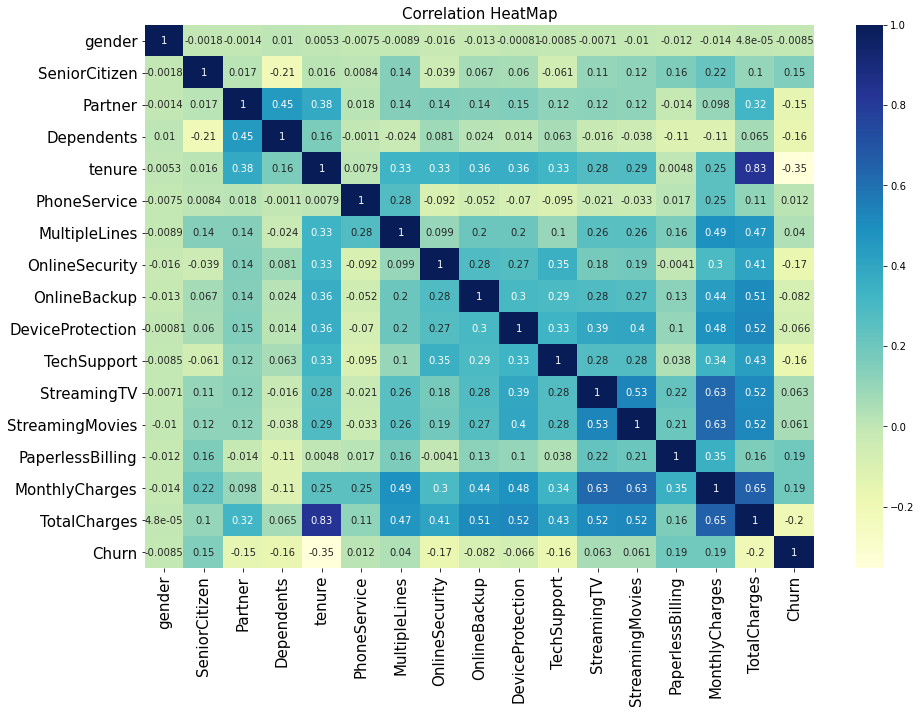

In [32]:
correlation = dataset.corr()
plt.figure(figsize = (15, 10))
plt.xticks(fontsize = 15, rotation = 45)
plt.yticks(fontsize = 15)
plt.title('Correlation HeatMap', fontsize = 15)
sns.heatmap(correlation, annot = True, cmap = 'YlGnBu')

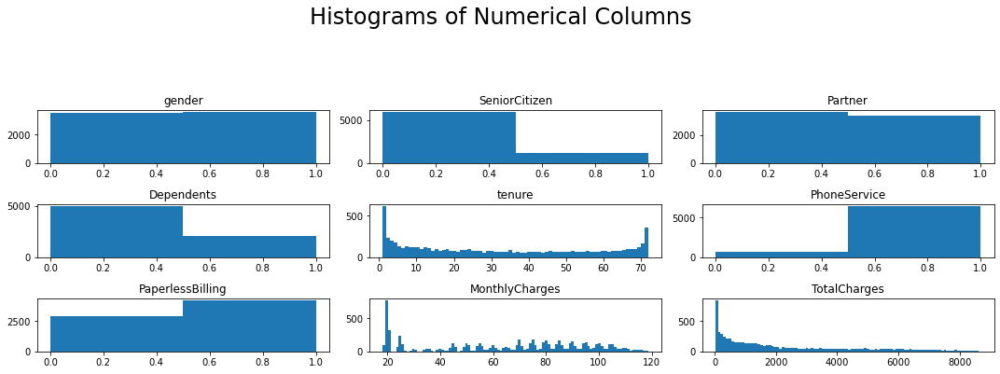

In [33]:
dataset2 = dataset[['gender', 
'SeniorCitizen', 'Partner','Dependents',
'tenure', 'PhoneService', 'PaperlessBilling',
'MonthlyCharges', 'TotalCharges']]

fig = plt.figure(figsize=(15, 10))
plt.suptitle('Histograms of Numerical Columns\n',horizontalalignment="center",fontstyle = "normal", 
             fontsize = 24, fontfamily = "sans-serif")

for i in range(dataset2.shape[1]):
    plt.subplot(6, 3, i + 1)
    f = plt.gca()
    f.set_title(dataset2.columns.values[i])
    vals = np.size(dataset2.iloc[:, i].unique())
    if vals >= 100:
        vals = 100
    plt.hist(dataset2.iloc[:, i], bins=vals)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

In [33]:
fig = make_subplots(rows=1, cols=2)
fig.add_trace(go.Pie(labels=['No', 'Yes'], values=dataset['Churn'].value_counts(), name="Churn"))
fig.update_layout(title_text="Churn Distributions", 
                  annotations =[dict(text='Churn', x=0.5, y=0.5, font_size=20, showarrow=False)])
fig.show()

Observations:
- From the above graph, we can see that there's very high relation between TotalCharges and Tenure.
- Gender distribution shows that the dataset features a relatively equal proportion of male and female customers. - --- Almost half of the customers in our dataset are female whilst the other half are male.
- Most of the customers in the dataset are younger people.
- Not many customers seem to have dependents whilst almost half of the customers have a partner.
- There are a lot of new customers in the organization (less than 10 months old) followed by a loyal customer segment that stays for more than 70 months on average.
- Most of the customers seem to have phone service and 3/4th of them have opted for paperless Billing
- Monthly charges span anywhere between 18USD to 118USD per customer with a huge proportion of customers on USD 20 segment.

In [34]:
dataset3 = dataset[['TotalCharges','MonthlyCharges','tenure']]

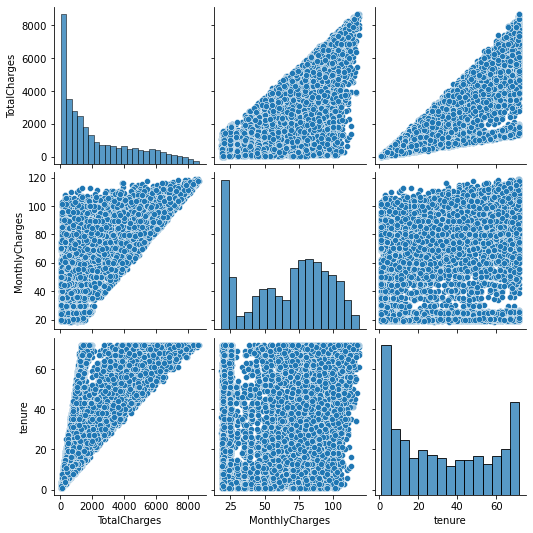

In [35]:
sns.pairplot(dataset3)

In [36]:
fig = px.histogram(dataset, x="Churn", color="Contract", barmode="group", title="<b>Customer contract distribution<b>")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

Observation:
- About 75% of customer with Month-to-Month Contract opted to move out as compared to 13% of customrs with One Year Contract and 3% with Two Year Contract

In [35]:
labels = dataset['PaymentMethod'].unique()
values = dataset['PaymentMethod'].value_counts()

fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.3)])
fig.update_layout(title_text="<b>Payment Method Distribution</b>")
fig.show()

In [37]:
fig = px.histogram(dataset, x="Churn", color="PaymentMethod", title="<b>Customer Payment Method distribution w.r.t. Churn</b>")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

Observation:
- From the above 2 figures, we conclude-
    - 33.6% occustomers preser Electronic cheque for payment. 22.8% prefer mailed cheque, while 21.9 and 21.6 prefer Bank transfer and Credit card payment respectively.
    - Please belonging to Electronic check base were the most who churned the telecom company. (high margin of churned customer belongs to Electronic check payment base)

In [38]:
fig = px.histogram(dataset, x="Churn", color="SeniorCitizen", title="<b>Customer Payment Method distribution w.r.t. Churn</b>")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

In [49]:
# for determining the CHurn distribution w.r.t Internet service and Gender
dataset[dataset["gender"]==0][["InternetService", "Churn"]].value_counts()

InternetService  Churn
DSL              0        965
Fiber optic      0        889
No               0        690
Fiber optic      1        664
DSL              1        219
No               1         56
dtype: int64

In [50]:
dataset[dataset["gender"]==1][["InternetService", "Churn"]].value_counts()

InternetService  Churn
DSL              0        992
Fiber optic      0        910
No               0        717
Fiber optic      1        633
DSL              1        240
No               1         57
dtype: int64

In [52]:
fig = go.Figure()

fig.add_trace(go.Bar(
  x = [['Churn - No', 'Churn - No', 'Churn - Yes', 'Churn - Yes'],
       ["Female", "Male", "Female", "Male"]],
  y = [965, 992, 219, 240], #putting the values from above calculations.
  name = 'DSL',
))

fig.add_trace(go.Bar(
  x = [['Churn - No', 'Churn - No', 'Churn - Yes', 'Churn - Yes'],
       ["Female", "Male", "Female", "Male"]],
  y = [889, 910, 664, 633],#putting the values from above calculations.
  name = 'Fiber optic',
))

fig.add_trace(go.Bar(
  x = [['Churn - No', 'Churn - No', 'Churn - Yes', 'Churn - Yes'],
       ["Female", "Male", "Female", "Male"]],
  y = [690, 717, 56, 57],#putting the values from above calculations.
  name = 'No Internet',
))

fig.update_layout(title_text="<b>Churn Distribution with respcect to Internet Service and Gender</b>")

fig.show()

Observations:
- Less customers belonging to Senior Citizen criteria are churning customers.
- Customer using 'FiberOptic' are the most churned customer - reflecting tech.problem/insufficient support on fiber optic connection.
- DSL users are less in churned customers.
- There are small group of customers also belonging to No-Internet category who have changed the service providers.

In [81]:
fig = px.histogram(dataset, x="Churn", color="Dependents", barmode="group", title="<b>Dependents distribution</b>")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

In [83]:
fig = px.histogram(dataset, x="Churn", color="gender", barmode="group", title="<b>Gender distribution</b>")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

In [55]:
fig = px.histogram(dataset, x="Churn", color="Partner", barmode="group", title="<b>Chrun distribution with respect to Partners</b>")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

In [57]:
fig = px.histogram(dataset, x="Churn", color="SeniorCitizen", barmode="group", title="<b>Chrun distribution for SeniorCitizen</b>")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

Observations:
- Customers with dependents are more loyal. Customer without dependents have switched more services.
- Female Customers have churned more when compared with Male churned customers.
- Customers with partners are more loyal. Customer without partners are more likely to switch services.
- For seniorCitizen, we see that 666 customers remain loyal while 476 have churned. (big difference when compared with non senior citizen.)

In [59]:
# Adding color_map for differnt set of visuals
fig = px.histogram(dataset, x="Churn", color="OnlineSecurity", barmode="group", 
                   title="<b>Churn w.r.t Online Security</b>", color_discrete_map={"Yes": "#FF97FF", "No": "#AB63FA"})
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

In [62]:
fig = px.histogram(dataset, x="Churn", color="TechSupport",
                   barmode="group", title="<b>Chrun distribution w.r.t. TechSupport</b>",
                   color_discrete_map={"Yes": "#FF97FF", "No": "#AB63FA"})
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

In [90]:
fig = px.histogram(dataset, x="Churn", color="PhoneService",
                   barmode="group", title="<b>Chrun distribution w.r.t. PhoneService</b>",
                   color_discrete_map={"Yes": "#FF97FF", "No": "#AB63FA"})
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

In [93]:
fig = px.histogram(dataset, x="Churn", color="Contract",
                   barmode="group", title="<b>Chrun distribution w.r.t. Contract </b>",
                   color_discrete_map={"Yes": "#FF97FF", "No": "#AB63FA"})
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

In [94]:
fig = px.histogram(dataset, x="Churn", color="PaymentMethod",
                   barmode="group", title="<b>Chrun distribution w.r.t. Payment Method </b>",
                   color_discrete_map={"Yes": "#FF97FF", "No": "#AB63FA"})
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

Observations:
- Churning Rate of custome without Online security is way more that that of with security. - It could be that the price for Online security is very high or its a tedious and long task to apply for the service.
- Churning Rate of custome without technical Support is More. Reason could be Tedious task to connect with tech support or not correct support was provided to user.
- More Customers with phone services have churned in past month.
- Customers with Month-month billing have churned the most, where with contract with 1 and 2 years have stayed loyal.
- When copared the Payment methods, the customers billing with Electronic checks have churned the most.

In [66]:
fig = px.box(dataset, x='Churn', y = 'tenure')

fig.update_yaxes(title_text='Tenure (Months)', row=1, col=1) # y-axis
fig.update_xaxes(title_text='Churn', row=1, col=1) # x-axis

# Update size and title
fig.update_layout(autosize=True, width=750, height=600,
    title_font=dict(size=25, family='Courier'),
    title='<b>Tenure vs Churn</b>')

fig.show()

Observation-
- From above, we can conclude that the Customers with less tenure have churned more.

Text(0.5, 1.0, 'Distribution of monthly charges by churn')

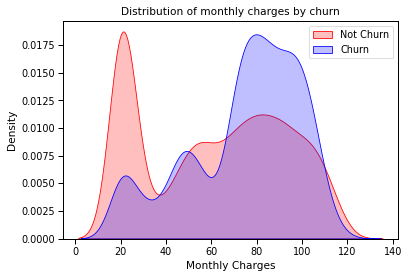

In [77]:
# comparasion with respect to numerical data:

sns.set_context("paper",font_scale=1.1)
ax = sns.kdeplot(dataset.MonthlyCharges[(dataset["Churn"] ==0) ],
                color="Red", shade = True);
ax = sns.kdeplot(dataset.MonthlyCharges[(dataset["Churn"] ==1) ],
                ax =ax, color="Blue", shade= True)
ax.legend(["Not Churn","Churn"],loc='upper right')
ax.set_ylabel('Density')
ax.set_xlabel('Monthly Charges')
ax.set_title('Distribution of monthly charges by churn')

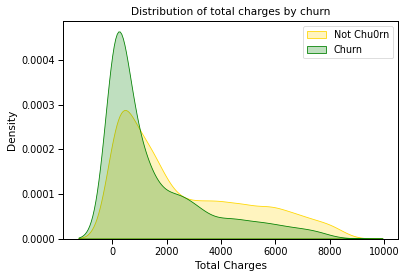

In [80]:
ax = sns.kdeplot(dataset.TotalCharges[(dataset["Churn"] == 0) ],
                color="Gold", shade = True);
ax = sns.kdeplot(dataset.TotalCharges[(dataset["Churn"] == 1) ],
                ax =ax, color="Green", shade= True);
ax.legend(["Not Chu0rn","Churn"],loc='upper right');
ax.set_ylabel('Density');
ax.set_xlabel('Total Charges');
ax.set_title('Distribution of total charges by churn');

Observation:
- Custoers with Higher amount of Monthly Charges have churned in past.
- Customers with Less 'Total Charge' have churned in past month.

Text(0.5, 1.0, 'Correlation with Churn Rate \n')

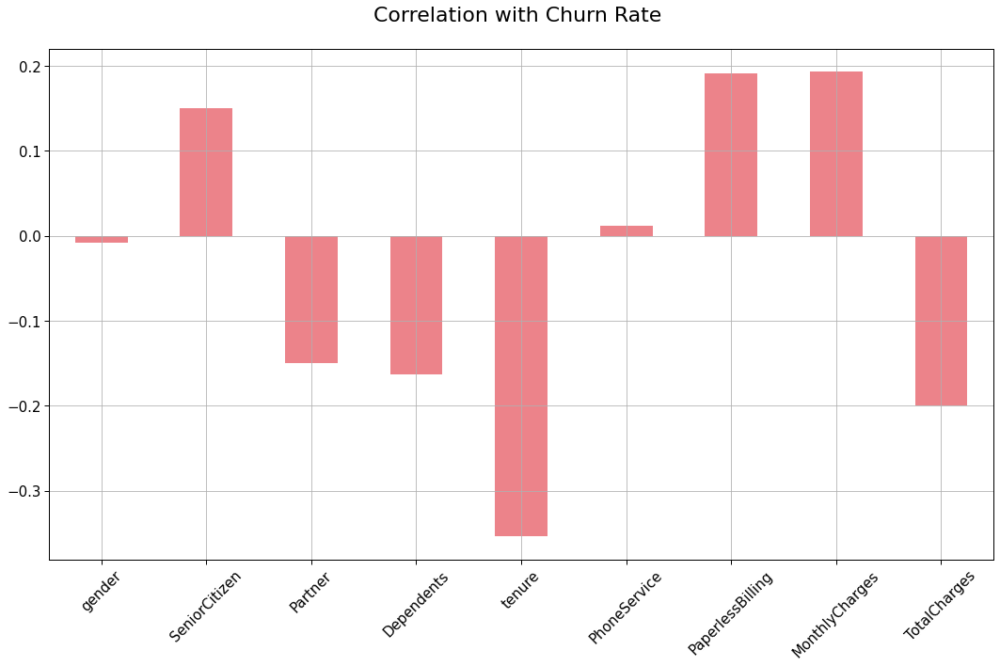

In [79]:
dataset2 = dataset[['gender','SeniorCitizen', 'Partner','Dependents','tenure', 'PhoneService', 'PaperlessBilling',
'MonthlyCharges', 'TotalCharges']]

correlations = dataset2.corrwith(dataset.Churn)
correlations = correlations[correlations!=1]
correlations.plot.bar(
        figsize = (18, 10), 
        fontsize = 15, 
        color = '#ec838a',
        rot = 45, grid = True)
plt.title('Correlation with Churn Rate \n',
horizontalalignment="center", fontstyle = "normal", 
fontsize = "22", fontfamily = "sans-serif")

Observation:
- The above graph depicts the general behaviour of Churning customer with respect to data:
    - Female customers churned more.
    - Senior citizes have churned more.
    - Customers with no partner and no dependents have churned more.
    - Customers with very less tenure have churned the most.
    - Customers opted for Phone service have churned more.
    - Customer who opted paperless biling and having more monthly charges have churned.
    - Customers with less Total charges have churned more.

### 4. Data pre-processing:
- Segregate predictors vs target attributes
- Check for target balancing and fix it if found imbalanced.
- Perform train-test split.
- Check if the train and test data have similar statistical characteristics when compared with original data.

In [37]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7032 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            7032 non-null   int64  
 1   SeniorCitizen     7032 non-null   int64  
 2   Partner           7032 non-null   int64  
 3   Dependents        7032 non-null   int64  
 4   tenure            7032 non-null   int64  
 5   PhoneService      7032 non-null   int64  
 6   MultipleLines     7032 non-null   int64  
 7   InternetService   7032 non-null   object 
 8   OnlineSecurity    7032 non-null   int64  
 9   OnlineBackup      7032 non-null   int64  
 10  DeviceProtection  7032 non-null   int64  
 11  TechSupport       7032 non-null   int64  
 12  StreamingTV       7032 non-null   int64  
 13  StreamingMovies   7032 non-null   int64  
 14  Contract          7032 non-null   object 
 15  PaperlessBilling  7032 non-null   int64  
 16  PaymentMethod     7032 non-null   object 


In [38]:
dataset.Contract.value_counts()

Month-to-month    3875
Two year          1685
One year          1472
Name: Contract, dtype: int64

In [39]:
dataset.PaymentMethod.value_counts()

Electronic check             2365
Mailed check                 1604
Bank transfer (automatic)    1542
Credit card (automatic)      1521
Name: PaymentMethod, dtype: int64

In [40]:
dataset.InternetService.value_counts()

Fiber optic    3096
DSL            2416
No             1520
Name: InternetService, dtype: int64

In [41]:
# Now, we'll perform one hot encoding to convert all the remaining categorical values to continous variables.
dataset3 = pd.get_dummies(dataset)
dataset3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7032 entries, 0 to 7042
Data columns (total 27 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   gender                                   7032 non-null   int64  
 1   SeniorCitizen                            7032 non-null   int64  
 2   Partner                                  7032 non-null   int64  
 3   Dependents                               7032 non-null   int64  
 4   tenure                                   7032 non-null   int64  
 5   PhoneService                             7032 non-null   int64  
 6   MultipleLines                            7032 non-null   int64  
 7   OnlineSecurity                           7032 non-null   int64  
 8   OnlineBackup                             7032 non-null   int64  
 9   DeviceProtection                         7032 non-null   int64  
 10  TechSupport                              7032 no

In [42]:
dataset3.head(5)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,OnlineSecurity,OnlineBackup,DeviceProtection,...,InternetService_DSL,InternetService_Fiber optic,InternetService_No,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,0,0,1,0,1,0,0,0,1,0,...,1,0,0,1,0,0,0,0,1,0
1,1,0,0,0,34,1,0,1,0,1,...,1,0,0,0,1,0,0,0,0,1
2,1,0,0,0,2,1,0,1,1,0,...,1,0,0,1,0,0,0,0,0,1
3,1,0,0,0,45,0,0,1,0,1,...,1,0,0,0,1,0,1,0,0,0
4,0,0,0,0,2,1,0,0,0,0,...,0,1,0,1,0,0,0,0,1,0


In [43]:
# now dataset3 is ready to be worked on and for pre-modelling activities:
print(' Dividing dataset into Dependent and independent variable set:')
X = dataset3.drop(columns='Churn')
y = dataset3['Churn']
print(X.shape)
print(y.shape)

 Dividing dataset into Dependent and independent variable set:
(7032, 26)
(7032,)


In [44]:
# performing train-test split:

X_train, X_test, y_train, y_test = train_test_split(X, y,stratify = y, test_size = 0.2)
#to resolve class imbalance we use stratify parameter.
                                                    
print("Number transactions X_train dataset: ", X_train.shape)
print("Number transactions y_train dataset: ", y_train.shape)
print("Number transactions X_test dataset: ", X_test.shape)
print("Number transactions y_test dataset: ", y_test.shape)

Number transactions X_train dataset:  (5625, 26)
Number transactions y_train dataset:  (5625,)
Number transactions X_test dataset:  (1407, 26)
Number transactions y_test dataset:  (1407,)


In [45]:
y_train.value_counts()

0    4130
1    1495
Name: Churn, dtype: int64

In [46]:
ratio = y_train[y_train==0].count() / y_train[y_train==1].count()
print('Distribution of target variable in TRAIN data:', ratio)

Distribution of target variable in TRAIN data: 2.762541806020067


In [47]:
y_test.value_counts()

0    1033
1     374
Name: Churn, dtype: int64

In [48]:
ratio = y_test[y_test==0].count() / y_test[y_test==1].count()
print('Distribution of target variable in TEST data:', ratio)

Distribution of target variable in TEST data: 2.7620320855614975


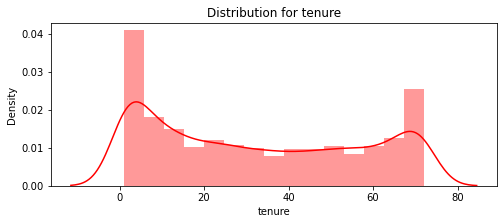

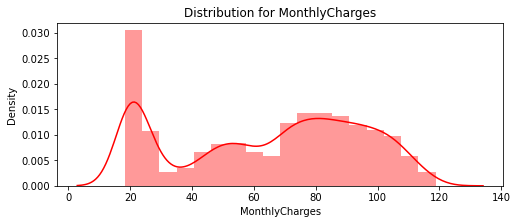

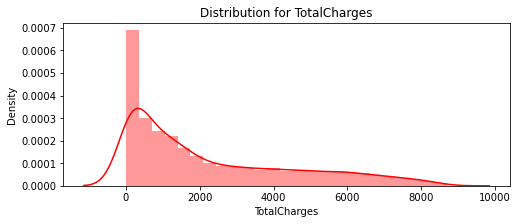

In [50]:
import warnings
warnings.filterwarnings('ignore')

# to check the distribution of the numerical values, if Standarization is needed-

def distplot(feature, frame, color='r'):
    plt.figure(figsize=(8,3))
    plt.title("Distribution for {}".format(feature))
    ax = sns.distplot(frame[feature], color= color)
    
num_cols = ["tenure", 'MonthlyCharges', 'TotalCharges']
for feat in num_cols: distplot(feat, dataset3)

In [51]:
X_train[num_cols].describe()

,tenure,MonthlyCharges,TotalCharges
count,5625.000000,5625.000000,5625.000000
mean,32.597156,64.903307,2301.568764
std,24.578962,30.155072,2280.095879
min,1.000000,18.400000,18.800000
25%,9.000000,35.500000,411.150000
50%,29.000000,70.550000,1415.000000
75%,56.000000,90.000000,3838.750000
max,72.000000,118.750000,8684.800000


Observations:
- We have now Split the data in Train and Test Cases.
- We have done the class balancing with the help of "stratify parameter".
- We created distribution graph(using custom defined - distribution funtion), to see how is the numerical data distribution.
- Its clear that we have to use StandardScaler to normalize the data.


In [52]:
#we have to use StandardScaler to normalize the data.
scaler= StandardScaler()

X_train[num_cols] = scaler.fit_transform(X_train[num_cols])
X_test[num_cols] = scaler.transform(X_test[num_cols])

In [53]:
X_train[num_cols].describe()

,tenure,MonthlyCharges,TotalCharges
count,5.625000e+03,5.625000e+03,5.625000e+03
mean,7.886284e-17,3.553701e-17,-8.952345e-17
std,1.000089e+00,1.000089e+00,1.000089e+00
min,-1.285651e+00,-1.542276e+00,-1.001261e+00
25%,-9.601403e-01,-9.751567e-01,-8.291699e-01
50%,-1.463640e-01,1.872718e-01,-3.888642e-01
75%,9.522341e-01,8.323284e-01,6.742339e-01
max,1.603255e+00,1.785818e+00,2.799794e+00


In [54]:
# we can see above how the data for X-Train has been standardised.

In [55]:
print(dataset3['Churn'].value_counts())
ratio = dataset3.Churn[dataset3['Churn']==0].count() / dataset3[dataset3['Churn']==1].count()
print('Distribution of target variable in dataset3 data:', ratio[0])

0    5163
1    1869
Name: Churn, dtype: int64
Distribution of target variable in dataset3 data: 2.7624398073836276


Observations:
- We have compared the statistical details betwen the train-test split data and Dataset3 data.
- The statsstical categories are matching for both the cases.
- Also, the division for the Class (Churn 0, 1) is equally divided with same ratio as in Dataset = 2.76

### 5. Model training, testing and tuning: 
- Train and test all ensemble models taught in the learning module.
- Suggestion: Use standard ensembles available. Also you can design your own ensemble technique using weak classifiers.
- Display the classification accuracies for train and test data.
- Apply all the possible tuning techniques to train the best model for the given data.
- Suggestion: Use all possible hyper parameter combinations to extract the best accuracies.
- Display and compare all the models designed with their train and test accuracies.
- Select the final best trained model along with your detailed comments for selecting this model.
- Pickle the selected model for future use.

In [56]:
# We are starting with very basic Decision tree classifier:

from sklearn.tree import DecisionTreeClassifier

dTree = DecisionTreeClassifier(criterion = 'gini', random_state=1)
dTree.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

In [57]:
print(dTree.score(X_train, y_train))
print(dTree.score(X_test, y_test))

0.9978666666666667
0.7263681592039801


In [58]:
from sklearn.tree import export_graphviz

train_char_label = ['No', 'Yes']
Credit_Tree_File = open('credit_tree.dot','w')
dot_data = export_graphviz(dTree, out_file=Credit_Tree_File, feature_names = list(X_train), class_names = list(train_char_label))
Credit_Tree_File.close()

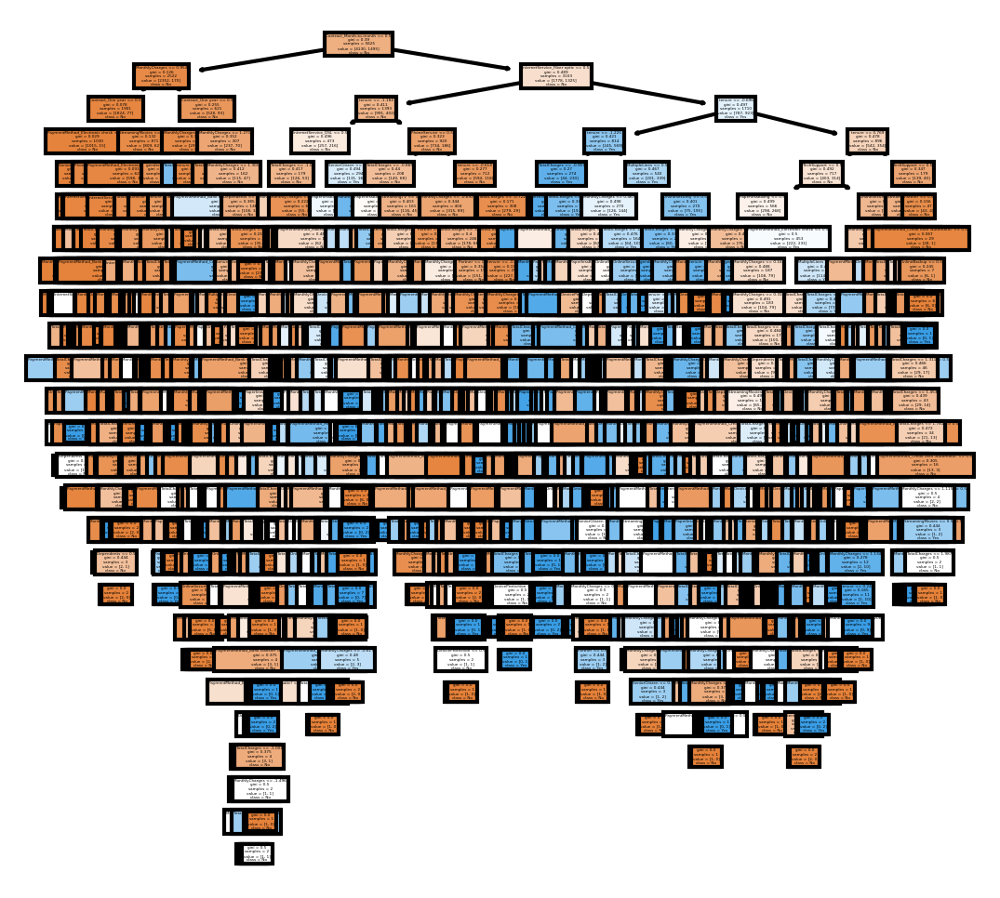

In [59]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

fn = list(X_train)
cn = ['No', 'Yes']
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4, 4), dpi=300)
plot_tree(dTree, feature_names = fn, class_names=cn, filled = True)

fig.savefig('tree.png')

Observation:
- We just created a very basic Over-fitting Decision tree for which the Train accuracy is 99.76% whereas the Test data accuracy is 74.76%.
- We'll now engage into more hypertuning effects to perfect the model.

In [60]:
# reducing overfittng through Regularization:

dTreeR = DecisionTreeClassifier(criterion = 'gini', max_depth = 3, random_state=1)
dTreeR.fit(X_train, y_train)
print(dTreeR.score(X_train, y_train))
print(dTreeR.score(X_test, y_test))

0.7918222222222222
0.7867803837953091


In [2]:
train_char_label = ['No', 'Yes']
Credit_Tree_FileR = open('credit_treeR1.dot','w')
dot_data = export_graphviz(dTreeR, out_file=Credit_Tree_FileR, feature_names = list(X_train), class_names = list(train_char_label))
Credit_Tree_FileR.close()

#Works only if "dot" command works on you machine

retCode = system("dot -Tpng credit_treeR.dot -o credit_treeR.png")
if(retCode>0):
    print("system command returning error: "+str(retCode))
else:
    display(Image("credit_treeR.png"))

![](credit_treeR.png)

0.7938877043354655


<AxesSubplot:>

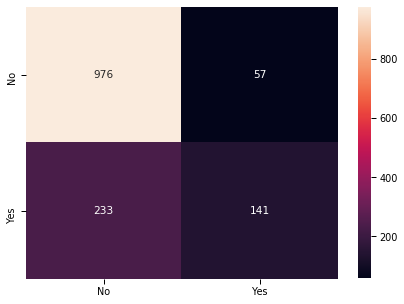

In [180]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

print(dTreeR.score(X_test , y_test))
y_predict = dTreeR.predict(X_test)

cm = confusion_matrix(y_test, y_predict, labels=[0, 1])

df_cm = pd.DataFrame(cm, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True ,fmt='g')

Observation:
- We used Regularization as hypertuning effect where we restrcted the Node leve to 3.
- Now the Accuracy for Train data has redueced from earlier to 79%, but the Accuracy of Test Data has increaed to 79.38% which is better than before.
- We made 1117 coreect predictions outof 1407 entires.

In [210]:
# Now, we are using Bagging techinque:

from sklearn.ensemble import BaggingClassifier

bgcl = BaggingClassifier(base_estimator=dTree, n_estimators=40,random_state=1)
#bgcl = BaggingClassifier(n_estimators=50,random_state=1)

bgcl = bgcl.fit(X_train, y_train)


0.7896233120113717


<AxesSubplot:>

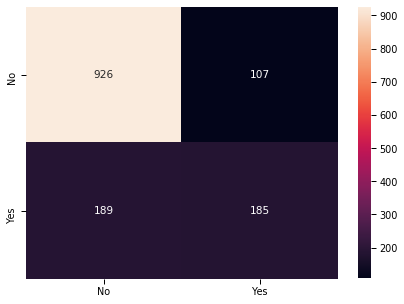

In [211]:
from sklearn.metrics import confusion_matrix

y_predict = bgcl.predict(X_test)

print(bgcl.score(X_test , y_test))

cm=confusion_matrix(y_test, y_predict,labels=[0, 1])

df_cm = pd.DataFrame(cm, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True ,fmt='g')

In [204]:
# Now, we are using ADA Boosting techinque:
from sklearn.ensemble import AdaBoostClassifier
#abcl = AdaBoostClassifier(n_estimators=10, random_state=1)
abcl = AdaBoostClassifier( n_estimators=35,random_state=1)
abcl = abcl.fit(X_train, y_train)

0.8130774697938877


<AxesSubplot:>

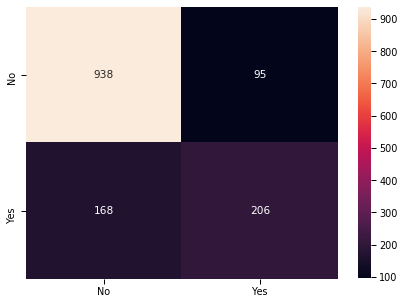

In [205]:
y_predict = abcl.predict(X_test)
print(abcl.score(X_test , y_test))

cm=confusion_matrix(y_test, y_predict,labels=[0, 1])

df_cm = pd.DataFrame(cm, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True ,fmt='g')

In [216]:
# Now, we are using Gradient Boosting techinque:
from sklearn.ensemble import GradientBoostingClassifier
gbcl = GradientBoostingClassifier(n_estimators = 40,random_state=1)
gbcl = gbcl.fit(X_train, y_train)

0.8194740582800284


<AxesSubplot:>

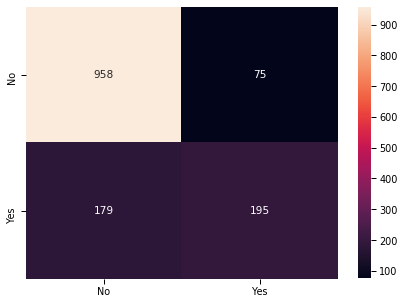

In [217]:
y_predict = gbcl.predict(X_test)
print(gbcl.score(X_test, y_test))
cm=confusion_matrix(y_test, y_predict,labels=[0, 1])

df_cm = pd.DataFrame(cm, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True ,fmt='g')

Observations:
- While using Bagging Techniques, we got accuracy to be 78.96%.
- With Ada Boosting technique, we got the results as 81.3%.
- For Gradient Boosting, the accuaracy score comes to be 81.94%.

In [218]:
# Random Forest Classifier:
from sklearn.ensemble import RandomForestClassifier
rfcl = RandomForestClassifier(n_estimators = 50, random_state=1,max_features=12)
rfcl = rfcl.fit(X_train, y_train)

0.7917555081734187


<AxesSubplot:>

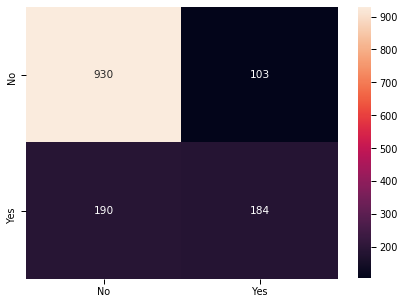

In [219]:
y_predict = rfcl.predict(X_test)
print(rfcl.score(X_test, y_test))
cm=confusion_matrix(y_test, y_predict,labels=[0, 1])

df_cm = pd.DataFrame(cm, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True ,fmt='g')

In [220]:
print(classification_report(y_test,y_predict))

              precision    recall  f1-score   support

           0       0.83      0.90      0.86      1033
           1       0.64      0.49      0.56       374

    accuracy                           0.79      1407
   macro avg       0.74      0.70      0.71      1407
weighted avg       0.78      0.79      0.78      1407



In [227]:
rfc_over = RandomForestClassifier(bootstrap = True, class_weight = None, criterion = 'gini', max_depth = 3, 
                                   max_features = 'auto', max_leaf_nodes = None, min_impurity_decrease = 0.0,
                                   min_impurity_split = None, min_samples_leaf = 1, min_samples_split = 2,
                                   min_weight_fraction_leaf = 0.0, n_estimators = 50, n_jobs = -1, 
                                   oob_score = False, random_state = 42, verbose = 0, warm_start = False)
rfc_over.fit(X, y)

random_forest_tree = open('random_forest.dot','w')
dot_data = export_graphviz(rfc_over.estimators_[0], out_file = random_forest_tree, feature_names = list(X_train), class_names = ['No', 'Yes'], rounded = True, proportion = False, filled = True)
random_forest_tree.close()

retCode = system("dot -Tpng random_forest.dot -o random_forest.png")
if(retCode>0):
    print("system command returning error: "+str(retCode))
else:
    display(Image("random_forest.png"))

system command returning error: 32512


![](Randomf.png)

Observations:
- For Random Forest, the best accuracy came out to be79.17%.

### 6. Conclusion and improvisation:
- Write your conclusion on the results.
- Detailed suggestions or improvements or on quality, quantity, variety, velocity, veracity etc. on the data points collected by the telecom operator to perform a better data analysis in future.

Observations:
- Various strategies can be implemented to eliminate customer churn. The best way to avoid customer churn is for a company to truly know its customers. This includes identifying customers who are at risk of churning and working to improve their satisfaction. 
- Improving customer service is, of course, at the top of the priority for tackling this issue. 
- Building customer loyalty through relevant experiences and specialized service is another strategy to reduce customer churn. 
- More advanced approach is to survey customers who have already churned to understand their reasons for leaving in order to adopt a proactive approach to avoiding future customer churn.
- It can also be seen that although having High Monthly charge, the Total charge for same customer is low.
- Profession, would be a great paramenter to perform this analysis. We'll get to know which Profession customer are making the churn most and target their needs for loyalty.
- Customers with Support have also churned. There's a need to investigate the internal support team of the Telecom company.
- Also, a large amount of customer base who joined recently(not on tenure) were the group that churned.

,Model,Accuracy_score
0,Decision Tree,74.760
2,Bagging,78.962
5,Random Forest,79.170
1,DT Regularization,79.388
3,AdaBoost,81.300
4,Gradient Boosting,81.990


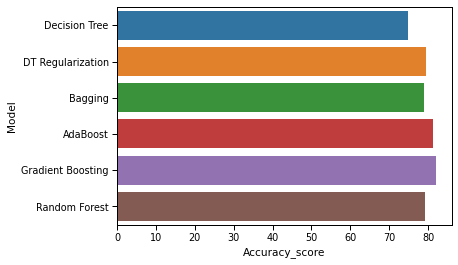

In [231]:
models = pd.DataFrame({
    'Model':['Decision Tree', 'DT Regularization','Bagging', 'AdaBoost','Gradient Boosting', 'Random Forest'],
    'Accuracy_score' :[74.76, 79.388, 78.962, 81.30, 81.99, 79.17]
})
models
sns.barplot(x='Accuracy_score', y='Model', data=models)

models.sort_values(by='Accuracy_score', ascending=True)

- The best Performing model was Gradient Boosting with score 81.99%.

Improvements that can be done:
- Balancing of data set. 
    - The dataset was not balanced with respect to the Target class. Data can be collcted in such manner that the division of both record type should be equal for better model.

- Attributes like Contract, Payment mode and Tenure were very helpful in identifying the customer group that churned.
- We can also include Attributes like Profession and internet-use/month to better understand the customer base and provide specific cutomer needed service.
- We can also suggest some actions/efforts that would retain the new joined(not in tenure) customers as churned ratio for them is very big.